In [1]:
import importlib
import os
from pathlib import Path

import geoviews as gv
import holoviews as hv
import matplotlib.pyplot as plt
import pandas as pd
import pyadcirc.adcirc_utils as au
import pyadcirc.figuregen as fg
import xarray as xr
from cartopy import crs
from holoviews import opts
from IPython.display import Image
from taccjm import taccjm as tjm
from holoviews.operation.datashader import datashade, shade, dynspread, spread, rasterize


import docker

# Figure out environment issue with this loading - need it for geoviews visualizations
# from holoviews.operation.datashader import datashade

%matplotlib widget

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
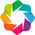

In [2]:
# Viewing options configurations
gv.extension("bokeh")
gv.opts.defaults(
    gv.opts.EdgePaths(width=700, height=700),
    gv.opts.Image(width=700, height=700),
    gv.opts.Points(width=700, height=700),
    gv.opts.RGB(width=450, height=450))

In [ ]:
# Dir with this notebook resides
base_dir = Path(os.path.dirname(os.getcwd()))
data_dir = base_dir / 'notebooks' / 'data'
data_dir.mkdir(exist_ok=True)
base_dir, data_dir

In [4]:
local_data = data_dir / 'def'
str(local_data)
os.system(f'ls -lt {local_data} | head -n 10')

total 21104
drwxr-xr-x  2 carlos  staff       64 Feb  4 19:09 fg_temp
-rw-r--r--  1 carlos  staff     7417 Feb  4 19:09 mesh_test.inp
-rw-r--r--  1 carlos  staff     7417 Feb  4 19:09 mesh_minimal_test.inp
-rw-r--r--  1 carlos  staff   900391 Feb  4 19:08 mesh_0001.jpg
-rw-------  1 carlos  staff     6588 Feb  4 18:54 mesh_plot.inp
-rw-r--r--  1 carlos  staff     4083 Feb  4 18:41 mesh_coast.inp
drwxr-xr-x  2 carlos  staff       64 Feb  4 18:02 Temp
-rw-r--r--  1 carlos  staff  2588882 Feb  4 18:02 si_mesh_coast_0001.jpg
-rw-r--r--  1 carlos  staff  4305998 Feb  4 17:55 si_mesh_0001.jpg


0

# ADCIRC Run Example

TODO: Finish outline
Purpose of this notebook is to compress ADCIRC Output Files and Generate Common Images Related to Them

The notebook is organized as follows:

* Setup:
    * TACC Job Manager
    * ADCIRC Data
    * ADCIRC Executables
* 

## Set-Up

Here we go over the basic set-up of how this will be run.

## TACC Job Manager Set-Up

* Lets name our job manager instance `l1`. The name of the JM instance will dictate where all app, job, and other data generated by taccjm will be stored. 

* Choose system to run ADCIRC on - Here we choose ls6 - [Lonestar 6](https://portal.tacc.utexas.edu/user-guides/lonestar5)

In [6]:
jm = 'l1'
system = 'ls6'

#### Initializing TACC Job Manager

In [7]:
if jm not in tjm.list_jms():
    tjm.init_jm(jm, system)

Username:  clos21
psw:  ·········
mfa:  461843


#### Basic TACC Job Manager Commands

In [8]:
# Defaults to user home directory
tjm.list_files(jm)

['miniconda3',
 'vim',
 'node-v16.13.1-linux-x64.tar.xz',
 'lazygit',
 'fish-shell',
 'local',
 'cool',
 'adcirc_execs',
 'go1.17.5.linux-amd64.tar.gz',
 'go',
 'nodejs',
 'utils',
 'exa',
 'repos']

## ADCIRC Data and Executables

* Publicly accessible data is available for users to access at `/work/06307/clos21/pub/adcirc`.

* Directories `inputs` and `execs` contain input data/configuration files for ADCIRC runs and executables to run them.

* README docs within directories contain more info on how executables/inputs.

In [9]:
# Pub dir paths on TACC. Should be accessible from all systems
pub_dir = Path('/work2/06307/clos21/pub')
adc_inputs = pub_dir / 'adcirc' / 'inputs'
adc_execs = pub_dir / 'adcirc' / 'execs'

tjm.list_files(jm, adc_inputs), tjm.list_files(jm, adc_execs)

(['Alaska', 'Texas', 'ShinnecockInlet'], ['ls6', 'stampede2'])

### SI Inlet Data

Lets look at the README file available for the ShinnecockInlet Area

In [10]:
si_path = adc_inputs / 'ShinnecockInlet'

print(tjm.read(jm, si_path / 'README.rst'))

###########################
Shinnecock Inlet Base Grid
###########################

[Shinnecock Inlet](https://adcirc.org/home/documentation/example-problems/shinnecock-inlet-ny-with-tidal-forcing-example/) example.

Mesh Files - mesh/*

Description of mesh file directories for particular area.

-------
Default
-------

Only one mesh contained currently here, which is the default mesh used containing a grid (fort.14) and a control file (fort.15) with just tidal forcing confgured with tidal forcing constituents derived from [TPX09.1](https://www.tpxo.net/home) configured via [OceanMesh2D](https://github.com/CHLNDDEV/OceanMesh2D).

The default control file (fort.15) included is set up to run with a timestep of 6 seconds for 20 days.

Furthere control file (fort.15) has the following recording stations set up (looking northwest for all):

 1. Back Right Bay  : -72.45 W, 40.870 E 
 2. Left of Inlet   : -72.50 W, 40.825 E 
 3. Right of Inlet  : -72.30 W, 40.800 E 

Output data (water elevat

In [11]:
# Default SI Inlet Mesh - Tides only
si_mesh_path = adc_inputs / 'ShinnecockInlet/mesh/def'

tjm.list_files(jm, si_mesh_path)

['mesh_plot.inp', 'Default.pal', 'fort.15', 'bathymetry_plot.inp', 'fort.14']

### Download locally

In [12]:
tjm.download(jm, remote_path=str(si_mesh_path), local_path=str(data_dir))
os.system(f'ls -lt {data_dir} | head -n 10')

total 0
drwxr-xr-x   5 carlos  staff  160 Feb  3 19:29 test-job_20220203_180159
drwx------  13 carlos  staff  416 Feb  3 18:00 def
drwxr-xr-x   4 carlos  staff  128 Feb  3 17:47 test-job_20220203_162406
drwxr-xr-x  22 carlos  staff  704 Jan 19 23:55 examples


0

## Visualizing ADCIRC Grids

### Using ADCIRC Utils Library and Python

Bugs here in read_fort15 methods. Investigate later.

In [ ]:
importlib.reload(au)

<module 'pyadcirc.adcirc_utils' from '/Users/carlos/repos/pyadcirc/src/pyadcirc/adcirc_utils.py'>

In [18]:
au.get_def('EMO')

('EMO = , j=1,NETA ; amplitude and phase (in degrees) of the harmonic forcing '
 'function at the elevation specified boundaries for frequency k and elevation '
 'specified boundary forcing node j. NOTE that the parameter NETA is defined '
 'and read in from Grid and Boundary Information File: the forcing values are '
 'preceded by an alphanumeric descriptor EALPHA to facilitate verifying that '
 'the correct data matches a given frequency.')


In [ ]:
grid = au.read_fort14(str(data_dir / 'def/fort.14'))
grid = au.read_fort15(str(data_dir / 'def/fort.15'), grid)
grid

### Using FigureGen Docker Image

Python docker instance. Make sure docker installed locally

First we initialize the client:

In [5]:
client = docker.from_env()

Get list of images and running containers

In [34]:
client.images.list(), client.containers.list()

([<Image: 'clos21/taccjm:0.0.1', 'taccjm-docker:latest'>,
  <Image: 'clos21/taccjm:0.0.0'>,
  <Image: 'zcobell/adcirc_20200513:latest'>,
  <Image: 'tacc/tapis-cli:latest'>,
  <Image: 'georgiastuart/figuregen-serial:latest'>,
  <Image: 'georgiastuart/figuregen:latest'>,
  <Image: 'tacc/tacc-ubuntu18-impi19.0.7-common:latest'>],
 [])

In [41]:
"<Image: 'georgiastuart/figuregen-serial:latest'>" in [str(x) for x in client.images.list()]

True

#### Running Figuregen Image 

Note we want to use the `'georgiastuart/figuregen-serial:latest'`. More documentation on this image at - https://github.com/georgiastuart/FigureGen/blob/containers/CONTAINER-README.md

In [45]:
res = client.containers.run('georgiastuart/figuregen-serial', 'ls /mnt/data',
                      volumes={str(local_data): {'bind': '/mnt/data', 'mode': 'rw'}})
print(res.decode('utf-8'))

Default.pal
bathymetry_plot.inp
fort.14
fort.15
mesh_plot.inp



In [48]:
os.system(f'ls {local_data}')

Default.pal
bathymetry_plot.inp
fort.14
fort.15
mesh_plot.inp


0

#### FigureGen Mesh Plot

In [43]:
mesh_extended = {
 'output_filename':'mesh_',
 'title': (1,'Shinecock Inlet Mesh'),
 'west_bound': d,
 'f14_file': 'fort.14',
 'plot_grid': True,
 'boundaries': (1, 'Tan'),
 'plot_width': 8.0,
 'plot_spacing': 0.25,
 'border_box_spacing': 0.25,
 'border_annotation_spacing': 0.5,
 'image_trim': True,
 'dpi_res': 300,
 'output_format': 'JPG'}

# Note for minimal set-up:
# Boundaries has to be set to 1 or else no image is produced
minimal = {
 'output_filename':'test_',
 'boundaries': (1, 'Red'),
 'west_bound': -73.0,
 'east_bound': -72.0,
 'south_bound': 40.32,
 'north_bound': 41.05,
 'f14_file': 'fort.14',
 'plot_grid': True}

config = minimal

In [44]:
mesh_input_file = local_data / 'mesh.inp'

fg.write_inp(config, str(mesh_input_file))

In [45]:
# See written config
fg.read_inp(mesh_input_file)

{'contours': {'fill': 0,
  'lines': 0,
  'file': 'fort.14',
  'contour_format': 'GRID-BATH',
  'conversion_factor': 1.0,
  'unit_label': 'None',
  'pallete': 'RGB',
  'pallete_file': 'None',
  'contour_lines': 'DEFAULT',
  'range': 'FIND',
  'interval': 0.25,
  'interval_split': 100,
  'label_interval': 1,
  'label_spacing': 0.5,
  'label_angle': '0',
  'label_fonts_size': 8,
  'scale_label_interval': 1.0,
  'scale_width': 0.25},
 'particles': {'plot_flag': 0, 'file': 'None', 'appearance': (1, 0, 'Brown')},
 'vectors': {'plot_flag': False,
  'file': 'fort.74',
  'format': 'ADCIRC-OUTPUT',
  'unit_conversion_factor': 1.0,
  'units': 'None',
  'mag': 100.0,
  'spacing': 0.15,
  'head_dims': (0.06, 0.04, 0.01),
  'scale_mag': 'FIND'},
 'verbosity': 4,
 'gmt_path': '/gmt-4.5.18/bin/',
 'gs_path': '/bin/',
 'temp_path': 'fg_temp',
 'output_filename': 'test_',
 'title': (0, 'Plot Title'),
 'time_bar': (0, 2005, 8, 6, 19, 0, 0),
 'west_bound': -73.0,
 'east_bound': -72.0,
 'south_bound': 40.3

In [46]:
cmnd = f'bash -c "cd /mnt/data && figuregen -I {mesh_input_file.name}"'
res = client.containers.run('georgiastuart/figuregen-serial', cmnd,
                      volumes={str(local_data): {'bind': '/mnt/data', 'mode': 'rw'}})
print(res.decode('utf-8'))

 
--------------------------------------
FigureGen 51                2012/10/08
 
This program reads raw ADCIRC files
and uses GMT to generate a figure with
contours and vectors plotted within a
specified lat/lon box.
--------------------------------------
 
Core 0000 read the input file.
 
PRE-PROCESSING:
 
Core 0000 processed the grid file.
 
GENERATING IMAGES:
 
Core 0000 started record 0001.
Core 0000 wrote the underlying mesh for record 0001.
Core 0000 wrote the scale for record 0001.
Core 0000 wrote the levee/road boundaries for record 0001.
Core 0000 created the raster images for record 0001.
Core 0000 completed record 0001.



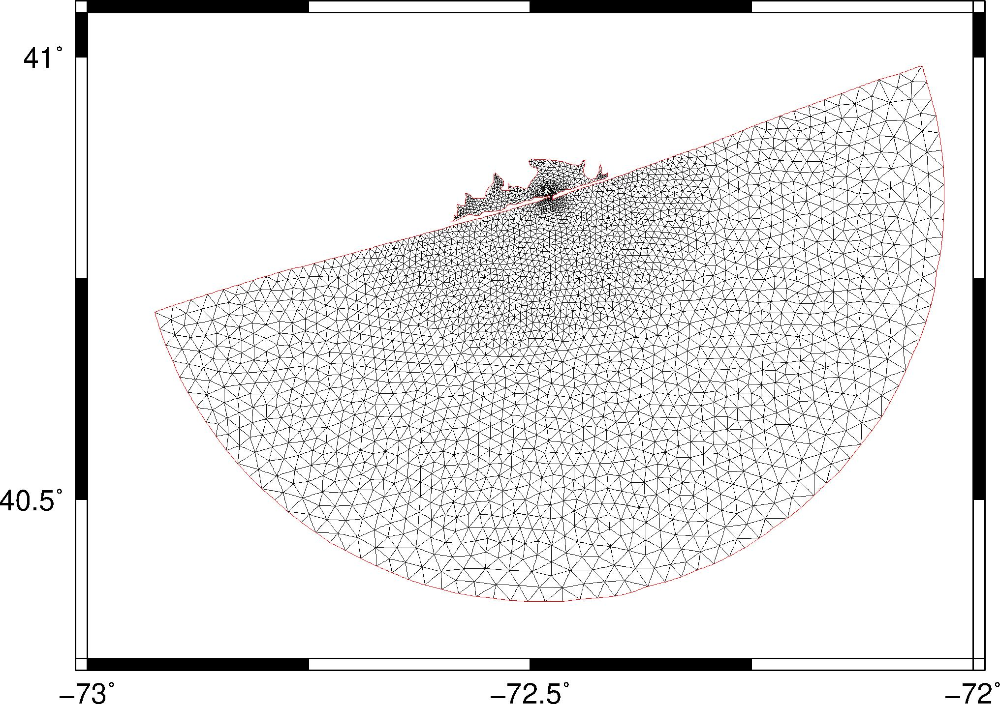

In [47]:
image_name = local_data / f"{config['output_filename']}0001.jpg"
Image(filename=image_name, width = 800, height = 400)

##### Add Coastlines

TODO: Adding a coastline for some reason causes a silent failure - No image produced. Investigate further.

In [48]:
test_file = local_data / 'mesh_coast.inp'

# mesh_config['coastline'] = (1, 'Black', 1, 1)
fg.write_inp(config, str(local_data / test_file),
             output_filename='test_coast_',
             coastline=(1, 'Green', 1, 1))

In [49]:
new_config = fg.read_inp(str(test_file))
new_config['output_filename'], new_config['plot_width'], new_config['coastline']

('test_coast_', 6.0, (1, 'Green', 1, 1))

In [51]:
cmnd = f'bash -c "cd /mnt/data && figuregen -I {test_file.name}"'
res = client.containers.run('georgiastuart/figuregen-serial', cmnd,
                      volumes={str(local_data): {'bind': '/mnt/data', 'mode': 'rw'}})
print(res.decode('utf-8'))

 
--------------------------------------
FigureGen 51                2012/10/08
 
This program reads raw ADCIRC files
and uses GMT to generate a figure with
contours and vectors plotted within a
specified lat/lon box.
--------------------------------------
 
Core 0000 read the input file.
 
PRE-PROCESSING:
 
Core 0000 processed the grid file.
 
GENERATING IMAGES:
 
Core 0000 started record 0001.
Core 0000 wrote the underlying mesh for record 0001.
Core 0000 wrote the scale for record 0001.
Core 0000 wrote the levee/road boundaries for record 0001.
Core 0000 wrote the coastline for record 0001.
Core 0000 created the raster images for record 0001.
Core 0000 completed record 0001.



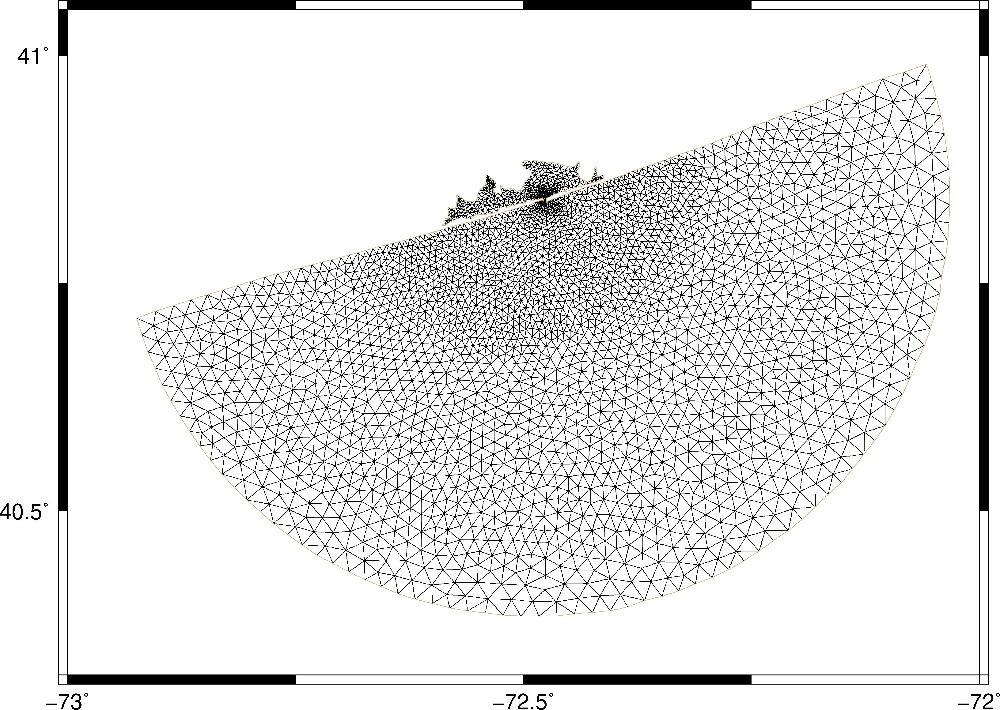

In [30]:
image_name = local_data / f"{config['output_filename']}0001.jpg"
Image(filename=image_name, width = 800, height = 400)

#### Mesh Spacing

In [13]:
'12312'.ljust(10, ' ')

'12312     '

#### FigureGen Bathymetry Plot

In [ ]:
config = {
 'west_bound': -73.0132,
 'east_bound': -71.9433,
 'north_bound': 41.0508,
 'south_bound': 40.32388,
 'f14_file': 'fort.14',
 'output_filename': 'si_bathymetry',
 'output_format': 'JPG',
 'contours': {'contour_format': 'GRID-BATH',
              'file': 'fort.14',
              'fill': 1,
              'lines': 0,
              'pallete': 'SMS+Intervals',
              'pallete_file': ('TopoBlueGreen.pal','TopoBlueGreen.tx'),
              'unit_label': 'm'}}


In [61]:
in_file = 'bathymetry_plot.inp'
config = fg.read(str(local_data / in_file))
config

{'background_image': (0, 'Clint1.txt'),
 'border_annotation_spacing': 0.5,
 'border_box_spacing': 0.25,
 'boundaries': (0, 'Brown'),
 'coastline': (0, 'White', 4, 4),
 'contours': {'contour_format': 'GRID-BATH',
              'contour_lines': 'DEFAULT',
              'conversion_factor': 1.0,
              'file': 'fort.14',
              'fill': 1,
              'interval': 0.25,
              'interval_split': 100,
              'label_angle': '0',
              'label_fonts_size': 8,
              'label_interval': 1,
              'label_spacing': 0.5,
              'lines': 1,
              'pallete': 'SMS',
              'pallete_file': 'Default.pal',
              'range': 'FIND',
              'scale_label_interval': 1.0,
              'scale_width': 0.25,
              'unit_label': 'm'},
 'dpi_res': 300,
 'east_bound': -71.9433,
 'f14_file': 'fort.14',
 'georef': (0, 0),
 'gmt_path': '/gmt-4.5.18/bin/',
 'gs_path': '/bin/',
 'image_trim': True,
 'kmx_opts': (0, 75, 2, '200508

{'contours': {'fill': 1,
  'lines': 1,
  'file': 'fort.14',
  'contour_format': 'GRID-BATH',
  'conversion_factor': 1.0,
  'unit_label': 'm',
  'pallete': 'SMS',
  'pallete_file': 'Default.pal',
  'contour_lines': 'DEFAULT',
  'range': 'FIND',
  'interval': 0.25,
  'interval_split': 100,
  'label_interval': 1,
  'label_spacing': 0.5,
  'label_angle': '0',
  'label_fonts_size': 8,
  'scale_label_interval': 1.0,
  'scale_width': 0.25},
 'particles': {'plot_flag': 0,
  'file': 'pth.201006290000.nc',
  'appearance': (1, 0, 'Brown')},
 'vectors': {'plot_flag': False,
  'file': 'Katrina_fort.74',
  'format': 'ADCIRC-OUTPUT',
  'unit_conversion_factor': 1.0,
  'units': 'm/s',
  'mag': 180.0,
  'spacing': 0.15,
  'head_dims': (0.06, 0.04, 0.01),
  'scale_mag': 'FIND'},
 'verbosity': 4,
 'gmt_path': '/gmt-4.5.18/bin/',
 'gs_path': '/bin/',
 'temp_path': 'Temp/',
 'output_filename': 'si_bathymetry',
 'title': '0,Shinnecock Inlet Bathymetry (m)',
 'time_bar': (0,),
 'west_bound': -73.0132,
 'east

In [54]:
client.containers.run('georgiastuart/figuregen-serial', f'bash -c "cd /mnt/data && figuregen -I {in_file}"',
                      volumes={str(local_data): {'bind': '/mnt/data', 'mode': 'rw'}})
print(res.decode('utf-8'))

Default.pal
bathymetry_plot.inp
fort.14
fort.15
mesh_plot.inp



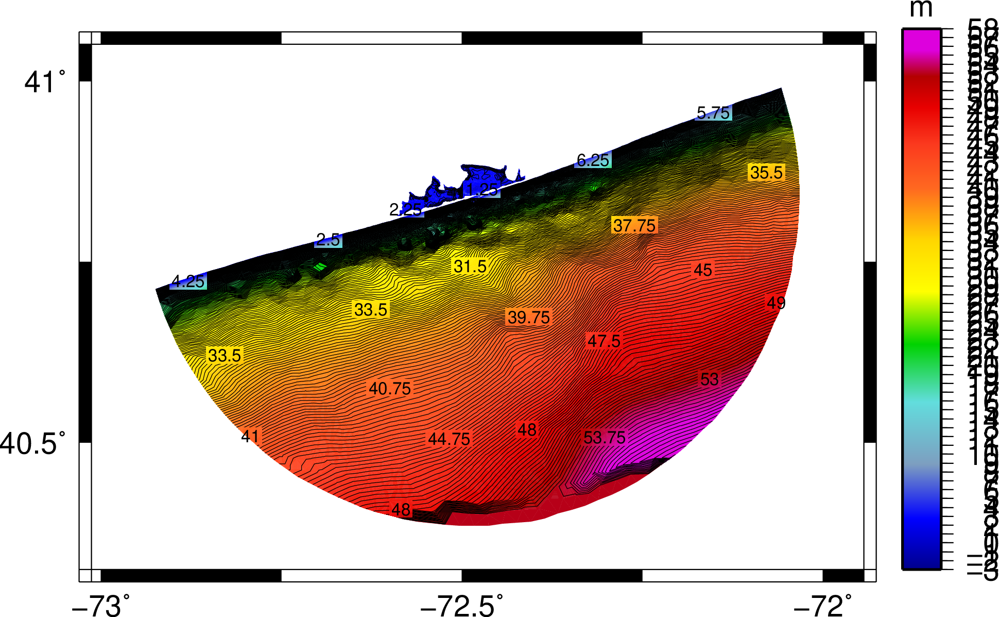

In [56]:
from IPython.display import Image
Image(filename=local_data / 'si_bathymetry0001.png') 

## ADCIRC Executables


### Building ADCIRC Versions

Requires: Github credentials set-up on remote system.

Access to [adcirc-cg](https://github.com/cdelcastillo21/adcirc-cg?organization=cdelcastillo21&organization=cdelcastillo21) repo.

Will be using TACC Job Manager to deploy and run an ADCIRC Compile script


TODO: Fix bugs in run_script with args.
Improve compile script to allow:
    Specifying destination directory
    Specifying output directory

In [57]:
tjm.list_scripts('l1')

['adcirc_compile']

In [61]:
tjm.deploy_script('l1', script_name=str(base_dir / 'scripts/adcirc_compile.sh'))

In [69]:
# Fix bug: https://github.com/cdelcastillo21/taccjm/issues/10
# For now just ran this command on ls6 manually to build v55.01 and v55_nodal_beta branches
tjm.run_script('l1', 'adcirc_compile', args=["v55.01", "https://github.com/cdelcastillo21/adcirc-cg.git", "1"])

run_script error


TACCJMError: args : 'list' object is not callable

### Choosing ADCIRC executable to use

Choose for appropriate TACC System:

In [77]:
tjm.list_files(jm, adc_execs)

['ls6', 'stampede2']

Choose appropriate version:

In [78]:
tjm.list_files(jm, adc_execs / 'ls6')

['v55_nodal_beta', 'v55.01']

Verify executables exist:

In [76]:
# Lonestar6 v55.01 execs
ls6_v55_path = adc_execs / 'ls6' / 'v55.01'
tjm.list_files(jm, ls6_v55_path)

['padcirc', 'adcprep']

## Running ADCIRC - SI Base Case

Here we go over the details of running ADCIRC 

### ADCIRC App Config

Basic ADCIRC App config:

In [80]:
tjm.list_apps(jm)

['ls6_adcirc--0.0.0']

In [82]:
tjm.get_app(jm, 'ls6_adcirc--0.0.0')

{'name': 'ls6_adcirc--0.0.0',
 'short_desc': 'General purpose adcirc application for ls6.',
 'long_desc': '',
 'default_node_count': 1,
 'default_processors_per_node': 10,
 'default_memory_per_node': '1',
 'default_max_run_time': '00:10:00',
 'default_queue': 'development',
 'entry_script': 'run.sh',
 'inputs': [],
 'parameters': [{'name': 'inputDirectory',
   'label': 'Input Directory',
   'desc': 'The directory containing ADCIRC input files.'},
  {'name': 'execDirectory',
   'label': 'Executables Directory',
   'desc': 'The directory containing ADCIRC executables to use.'},
  {'name': 'writeProcesses',
   'label': 'Number of Write Processes',
   'desc': 'Number of processes to dedicate to writing output data.'}],
 'outputs': [{'name': 'Outputs',
   'label': 'Output Directory',
   'desc': 'Directory containing output to archive.'}]}

### Configure job 

Configure inputs

In [91]:
# Set execs_dir for future cells to use
in_dir = si_mesh_path
execs_dir = ls6_v55_path
write_proc = 0

In [101]:
from pprint import pprint as pp
job_config = {'name': "test-job",
               'app':'ls6_adcirc--0.0.0',
               'desc':"Testing ADCIRC on LS6",
               'queue':"development",
               'node_count':1,
               'processors_per_node':4,
               'memory_per_node':1,
               'max_run_time':"00:00:10"}
job_config['inputs'] = {}
job_config['parameters'] = {'inputDirectory': f"{in_dir}",
                            'execDirectory' : f"{execs_dir}",
                            'writeProcesses': write_proc}
pp(job_config)

{'app': 'ls6_adcirc--0.0.0',
 'desc': 'Testing ADCIRC on LS6',
 'inputs': {},
 'max_run_time': '00:00:10',
 'memory_per_node': 1,
 'name': 'test-job',
 'node_count': 1,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55.01',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/ShinnecockInlet/mesh/def',
                'writeProcesses': 0},
 'processors_per_node': 4,
 'queue': 'development'}


### Deploy Job 


In [102]:
importlib.reload(tjm)

<module 'taccjm.taccjm' from '/Users/carlos/repos/taccjm/src/taccjm/taccjm.py'>

In [183]:
deployed = tjm.deploy_job(jm, job_config=job_config)
pp(deployed)

{'app': 'ls6_adcirc--0.0.0',
 'desc': 'Testing ADCIRC on LS6',
 'entry_script': 'run.sh',
 'inputs': {},
 'job_dir': '/scratch/06307/clos21/l1/jobs/test-job_20220203_180159',
 'job_id': 'test-job_20220203_180159',
 'max_run_time': '00:00:10',
 'memory_per_node': 1,
 'name': 'test-job',
 'node_count': 1,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55.01',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/ShinnecockInlet/mesh/def',
                'writeProcesses': 0},
 'processors_per_node': 4,
 'queue': 'development'}


In [184]:
tjm.list_files(jm, deployed['job_dir'])

['submit_script.sh', 'app.json', 'run.sh', 'test', 'job.json']

In [105]:
# TODO: fix bug here - see https://github.com/cdelcastillo21/taccjm/issues/9
tjm.list_job_files(jm, deployed['job_id'])

list_job_files error


TACCJMError: <Response [500]>Unable to parse json errors. Raw content:A server error occurred.  Please contact the administrator.

### Running Job

Now we can submit the job to run on the execution queue

In [185]:
submitted = tjm.submit_job(jm, deployed['job_id'])

In [186]:
pp(submitted)

{'app': 'ls6_adcirc--0.0.0',
 'desc': 'Testing ADCIRC on LS6',
 'entry_script': 'run.sh',
 'inputs': {},
 'job_dir': '/scratch/06307/clos21/l1/jobs/test-job_20220203_180159',
 'job_id': 'test-job_20220203_180159',
 'max_run_time': '00:00:10',
 'memory_per_node': 1,
 'name': 'test-job',
 'node_count': 1,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55.01',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/ShinnecockInlet/mesh/def',
                'writeProcesses': 0},
 'processors_per_node': 4,
 'queue': 'development',
 'slurm_id': '50473'}


### Checking job status

In [187]:
tjm.get_queue(jm)

[{'job_id': '50473',
  'job_name': 'test-job_2',
  'username': 'clos21',
  'state': 'Running',
  'nodes': '1',
  'remaining': '1',
  'start_time': '0:00:57'}]

We can also look at job files 

For example for adcirc runs we can look for an adcirc.log file (provided the appropriate setting is set in fort.15 file to output to log file)

In [199]:
job_files = tjm.list_files(jm, submitted['job_dir'])
job_files.sort()
job_files

['Default.pal',
 'PE0000',
 'PE0001',
 'PE0002',
 'PE0003',
 'adcirc.log',
 'adcprep',
 'app.json',
 'bathymetry_plot.inp',
 'fort.14',
 'fort.15',
 'fort.16',
 'fort.61.nc',
 'fort.62.nc',
 'fort.63.nc',
 'fort.64.nc',
 'fort.80',
 'job.json',
 'maxele.63.nc',
 'maxvel.63.nc',
 'mesh_plot.inp',
 'metis_graph.txt',
 'output.eo.txt',
 'padcirc',
 'partmesh.txt',
 'run.sh',
 'submit_script.sh',
 'test',
 'test-job_20220203_180159.e50473',
 'test-job_20220203_180159.o50473']

And we can peak at the end of the file to see how long the run is going

In [195]:
print(tjm.peak_file(jm, str(Path(submitted['job_dir']) / 'adcirc.log'), tail=2))


 TIME STEP =  107000  37.15% COMPLETE     ITERATIONS =   17     TIME =  0.64200000E+06
  ELMAX = -1.0169E-001 AT NODE      836  SPEEDMAX =  1.3272E-001 AT NODE      799  ON MYPROC =    0



In [194]:
print(tjm.peak_file(jm,
                    str(Path(submitted['job_dir']) / f"{submitted['job_id']}.e{submitted['slurm_id']}"), tail=2))

+ ibrun -np 4 ./padcirc -W 0
slurmstepd: error: *** JOB 50473 ON c302-005 CANCELLED AT 2022-02-03T18:03:25 DUE TO TIME LIMIT ***



# ADCIRC Output Files

Here we'll download and analyze some outputs

## F61 - Water Elevation at Recording Stations

See [documentation](https://adcirc.org/home/documentation/users-manual-v51/output-file-descriptions/elevation-time-series-at-specified-elevation-recording-stations-fort-61) for more info on this file.

In [201]:
path = tjm.download_job_file(jm, submitted['job_id'], 'fort.61.nc', dest_dir=data_dir)

In [133]:
f61 = xr.open_dataset(path)
f61

<xarray.Dataset>
Dimensions:       (time: 398, station: 3)
Coordinates:
  * time          (time) datetime64[ns] 2008-09-04T15:30:00 ... 2008-09-12T22...
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 ...
    x             (station) float64 ...
    y             (station) float64 ...
    zeta          (time, station) float64 ...
Attributes: (12/50)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            v55.01-10-g08f4100
    grid_type:          Triangular
    description:        Shinnecock Inlet V20051108               ! UPTO 32 CH...
    ...                 ...
    sfea0:              40.66
    cf:                 0.0025
    eslm:               5.0
    cori:               0.0001
    ntif:               5
    nbfr:               5

In [170]:
str(f61['station_name'].values[0].decode('utf-8'))[0:15]

'Back right bay '

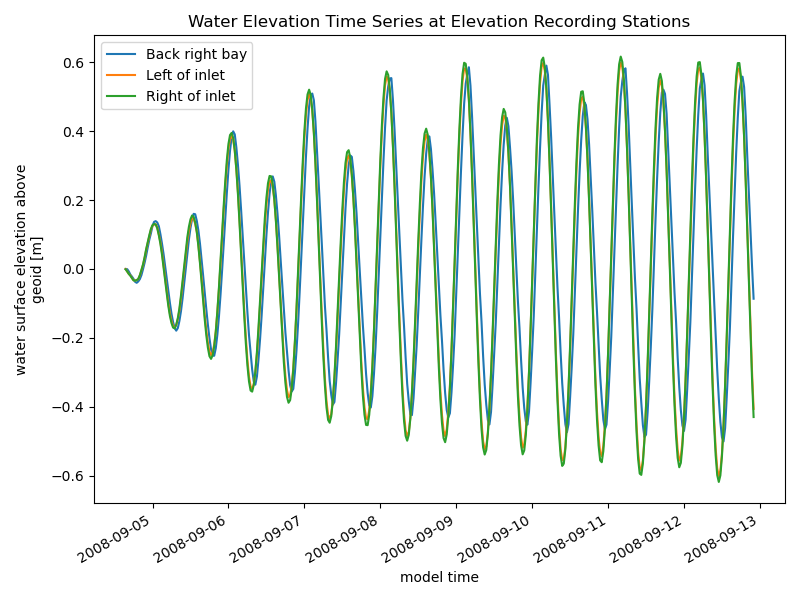

In [174]:
fig, ax =plt.subplots(1, 1, figsize=(8,6))
for i in range(3):
    name = str(f61['station_name'].values[i].decode('utf-8'))[0:14]
    f61.isel(station=i)['zeta'].plot(ax=ax, label=name)
ax.legend()
ax.set_title('Water Elevation Time Series at Elevation Recording Stations')
fig.tight_layout()

## F62 - Depth-averaged Velocity Time Series at Recording Stations

This is the depth-averaged velocity as computed by ADCIRC at nodes we set to record at.

See [documentation](https://adcirc.org/home/documentation/users-manual-v51/output-file-descriptions/depth-averaged-velocity-time-series-at-specified-velocity-recording-stations-fort-62) for more info on this file.

In [180]:
f62_path = tjm.download_job_file(jm, submitted['job_id'], 'fort.62.nc', dest_dir=data_dir)

In [181]:
f62 = xr.open_dataset(f62_path)
f62

<xarray.Dataset>
Dimensions:       (time: 398, station: 3)
Coordinates:
  * time          (time) datetime64[ns] 2008-09-04T15:30:00 ... 2008-09-12T22...
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 ...
    x             (station) float64 ...
    y             (station) float64 ...
    u-vel         (time, station) float64 ...
    v-vel         (time, station) float64 ...
Attributes: (12/50)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            v55.01-10-g08f4100
    grid_type:          Triangular
    description:        Shinnecock Inlet V20051108               ! UPTO 32 CH...
    ...                 ...
    sfea0:              40.66
    cf:                 0.0025
    eslm:               5.0
    cori:               0.0001
    ntif:               5
    nbfr:               5

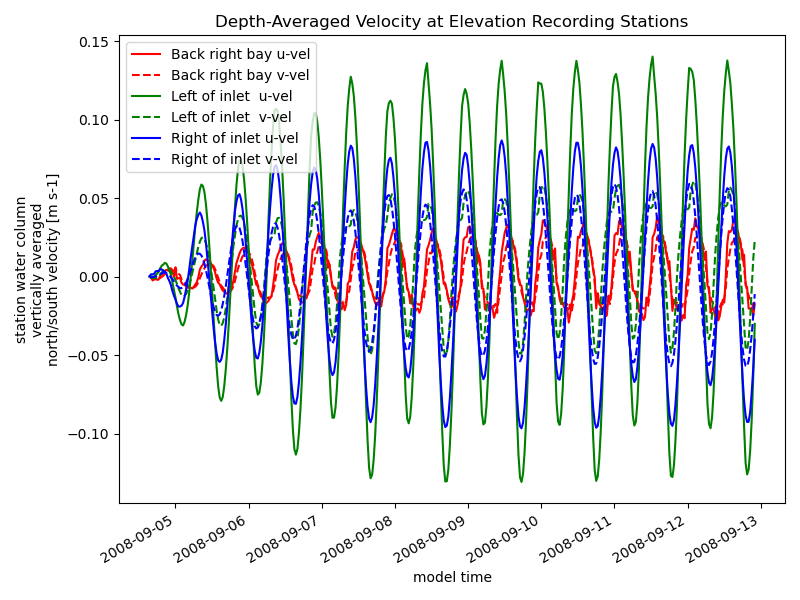

In [182]:
fig, ax =plt.subplots(1, 1, figsize=(8,6))
cs = ['r', 'g', 'b']
for i in range(3):
    name = str(f62['station_name'].values[i].decode('utf-8'))[0:14]
    f62.isel(station=i)['u-vel'].plot(ax=ax, color=cs[i], label=name + ' u-vel')
    f62.isel(station=i)['v-vel'].plot(ax=ax, color=cs[i], label=name + ' v-vel', linestyle='--')
ax.legend()
ax.set_title('Depth-Averaged Velocity at Elevation Recording Stations')
fig.tight_layout()

## F63 - Water Elevation at All Nodes

See [documentation](https://adcirc.org/home/documentation/users-manual-v51/output-file-descriptions/elevation-time-series-at-all-nodes-in-the-model-grid-fort-63) for more info on this file.

### Using Python

TODO: Bug here with importing datashade from holoviews. 

In [202]:
path = tjm.download_job_file(jm, submitted['job_id'], 'fort.63.nc', dest_dir=data_dir)

We have to clean up the files by removing a couple of duplicate variables (that are set as both coordinates and variables, violating xarray requirements). We can do that with:

```
ncks -O -x -v neta,nbdv,nvel,nbvv fort.63.nc clean.f63.nc
```

In [206]:
clean_file = Path(path).parents[0] / 'clean.f63.nc'
f63 = xr.open_dataset(clean_file)
f63

<xarray.Dataset>
Dimensions:      (mesh: 1, node: 3070, nele: 5780, nvertex: 3, nbou: 1,
                  nope: 1, time: 359)
Coordinates:
  * time         (time) datetime64[ns] 2008-09-04T15:30:00 ... 2008-09-12T02:...
    x            (node) float64 ...
    y            (node) float64 ...
Dimensions without coordinates: mesh, node, nele, nvertex, nbou, nope
Data variables:
    adcirc_mesh  (mesh) int32 ...
    depth        (node) float64 ...
    element      (nele, nvertex) int32 ...
    ibtype       (nbou) int32 ...
    ibtypee      (nope) int32 ...
    max_nvdll    int32 ...
    max_nvell    int32 ...
    nvdll        (nope) int32 ...
    nvell        (nbou) int32 ...
    zeta         (time, node) float64 ...
Attributes: (12/50)
    _FillValue:         -99999.0
    model:              ADCIRC
    version:            v55.01-10-g08f4100
    grid_type:          Triangular
    description:        Shinnecock Inlet V20051108               ! UPTO 32 CH...
    agrid:              Shinnecock Inlet Coarse Grid
    ...                 ...
    cf:                 0.0025
    eslm:               5.0
    cori:               0.0001
    ntif:               5
    nbfr:               5
    NCO:                netCDF Operators version 5.0.6 (Homepage = http://nco...

In [241]:
def build_mesh(data, cord=crs.PlateCarree()):
    # Triangle vertices, with third column being value to aggregate over
    verts= gv.Points(data[['x', 'y']].to_dataframe(), crs=cord)

    # Mesh triangle list
    tris = pd.DataFrame(data['element'].values-1)

    return verts, tris

### Using Figuregen

First lets try the maxelevation Plot

## F64 - Depth-averaged Velocity Time Series at all Nodes

See [documentation](https://adcirc.org/home/documentation/users-manual-v51/output-file-descriptions/depth-averaged-velocity-time-series-at-all-nodes-in-the-model-grid-fort-64) for more info on this file.

## Global Maximum and Minimum files 

See [documentation](https://adcirc.org/home/documentation/users-manual-v51/output-file-descriptions/maximum-elevation-all-nodes-in-the-model-grid-maxele-63/) for more info.

This includes:

 * maxele.63
 * maxvel.63 
 * maxwvel.63
 * maxrs.63
 * minpr.63

### Maximum Elevation

